# EDA

- Train dataset
- Test datase

In [1]:
!find ../input/train/ -name *_vh_*.tif | wc -l
!find ../input/test/ -name *_vh_*.tif | wc -l

17
16


Training dataset:
- 17 images of S1 with VV / VH polarizations
- imagery on 2015: 01, 04, 07, 08, 10
- image size : 10k x 10k pixels


Testing dataset:
- 16 images of S1 with VV / VH polarizations
- imagery on 2015: 01, 03, 04, 05, 06, 07, 08, 09, 10, 11

## EDA on produced tiles

In [2]:
csv_path = "../input/train_tiles/tile_stats.csv"

In [3]:
import pandas as pd
import matplotlib.pylab as plt
%matplotlib inline

In [4]:
df = pd.read_csv(csv_path)

In [5]:
print(df.shape)
df.head()

(8993, 9)


,index,img_min,img_max,img_mean,img_std,target_ratio,fold_index,skip,img_path
0,0,"(0.0, 0.0, 0.0)","(0.0, 0.0, 0.0)","(0.0, 0.0, 0.0)","(0.0, 0.0, 0.0)",0.000000,1,True,../input/train_tiles/images/20150408_38RPV_2_s...
1,1,"(0.00021996126, -0.0054738754, -0.0023031803)","(0.7458129, 3.2923973, 2.019105)","(0.0058296947, 0.026576746, 0.016203113)","(0.005033476, 0.02942681, 0.016364736)",0.000000,1,False,../input/train_tiles/images/20150408_38RPV_2_s...
2,2,"(0.0, 0.0, 0.0)","(0.21879235, 2.8722415, 1.4715494)","(0.013404857, 0.06091028, 0.037157908)","(0.016068378, 0.07856842, 0.044496164)",0.002460,1,False,../input/train_tiles/images/20150408_38RPV_2_s...
3,3,"(0.00023603518, 0.0012849291, 0.004304498)","(0.26368228, 4.673476, 2.3654168)","(0.022346808, 0.10128883, 0.061817892)","(0.015562968, 0.07138626, 0.038698178)",0.003868,1,False,../input/train_tiles/images/20150408_38RPV_2_s...
4,4,"(0.00023603518, -0.00090447697, 0.0026229876)","(0.25415438, 3.336488, 1.6894587)","(0.021353591, 0.09988875, 0.060620666)","(0.0147406515, 0.067181095, 0.036391318)",0.000889,1,False,../input/train_tiles/images/20150408_38RPV_2_s...


In [6]:
df = df[~df['skip']].copy()
print(df.shape)
df.head()

(8126, 9)


,index,img_min,img_max,img_mean,img_std,target_ratio,fold_index,skip,img_path
1,1,"(0.00021996126, -0.0054738754, -0.0023031803)","(0.7458129, 3.2923973, 2.019105)","(0.0058296947, 0.026576746, 0.016203113)","(0.005033476, 0.02942681, 0.016364736)",0.000000,1,False,../input/train_tiles/images/20150408_38RPV_2_s...
2,2,"(0.0, 0.0, 0.0)","(0.21879235, 2.8722415, 1.4715494)","(0.013404857, 0.06091028, 0.037157908)","(0.016068378, 0.07856842, 0.044496164)",0.002460,1,False,../input/train_tiles/images/20150408_38RPV_2_s...
3,3,"(0.00023603518, 0.0012849291, 0.004304498)","(0.26368228, 4.673476, 2.3654168)","(0.022346808, 0.10128883, 0.061817892)","(0.015562968, 0.07138626, 0.038698178)",0.003868,1,False,../input/train_tiles/images/20150408_38RPV_2_s...
4,4,"(0.00023603518, -0.00090447697, 0.0026229876)","(0.25415438, 3.336488, 1.6894587)","(0.021353591, 0.09988875, 0.060620666)","(0.0147406515, 0.067181095, 0.036391318)",0.000889,1,False,../input/train_tiles/images/20150408_38RPV_2_s...
5,5,"(0.00064501015, -0.00090447697, 0.0026229876)","(0.1937968, 2.1660764, 1.1015478)","(0.014446156, 0.07387875, 0.04416356)","(0.010743684, 0.054305725, 0.0295869)",0.001019,1,False,../input/train_tiles/images/20150408_38RPV_2_s...


In [7]:
df['fold_index'].unique()

array([1, 0, 2, 3])

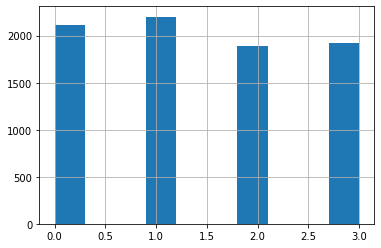

In [8]:
df['fold_index'].hist()

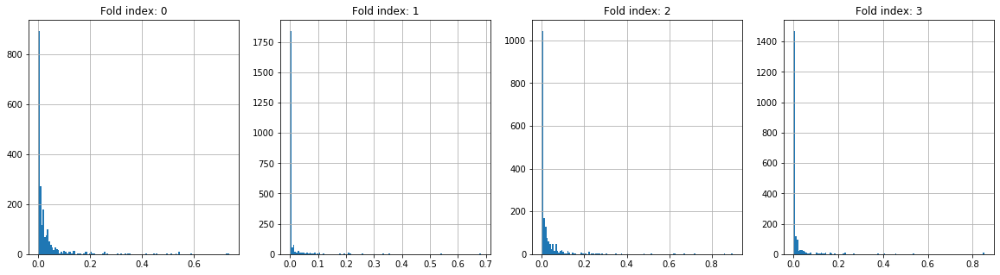

In [9]:
plt.figure(figsize=(20, 5))
folds = sorted(df['fold_index'].unique())
for i, index in enumerate(folds):
    m = df['fold_index'] == index
    plt.subplot(1, len(folds), i + 1)
    plt.title(f"Fold index: {index}")
    df.loc[m, 'target_ratio'].hist(bins=128)

In [10]:
import sys
sys.path.insert(0, "../code")

In [11]:
from dataflow.datasets import get_trainval_datasets

In [12]:
train_folds = [0, 1, 2]
val_folds = [3, ]

path = "../input/train_tiles/"

train_ds, val_ds = get_trainval_datasets(path, csv_path, train_folds=train_folds, val_folds=val_folds)

In [13]:
len(train_ds), len(val_ds)

(6205, 1921)

Training dataset

In [14]:
from dataflow.vis import render_image, render_mask, render_datapoint

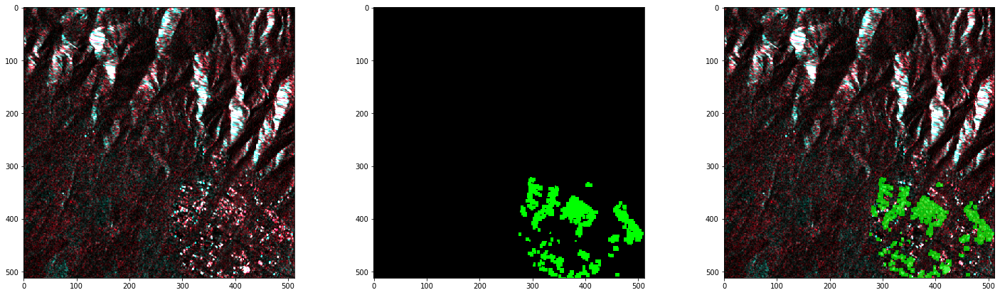

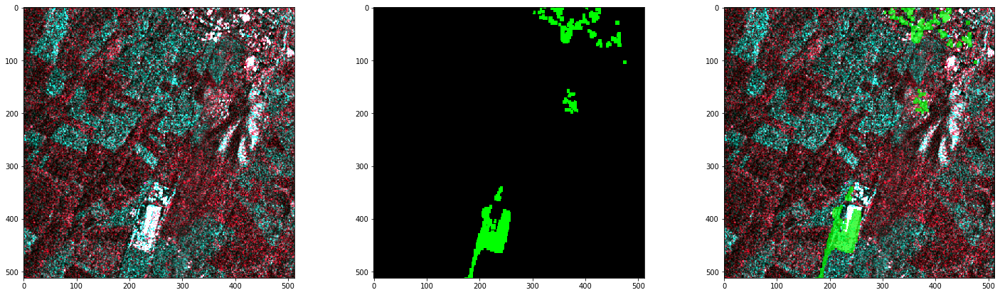

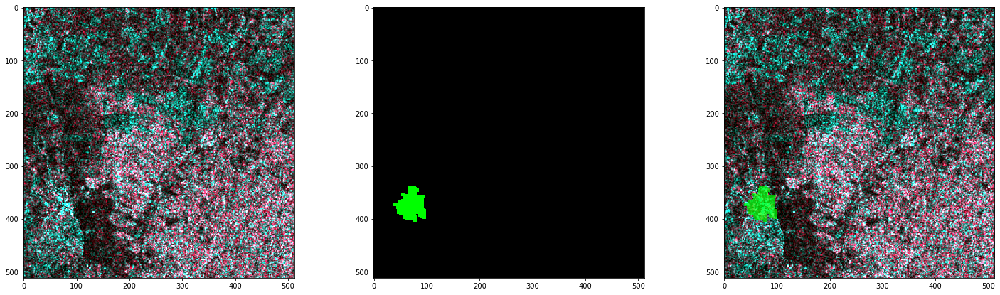

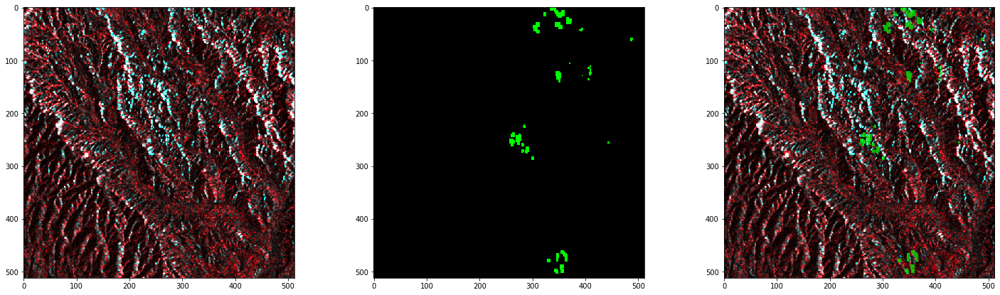

In [15]:
palette = [0, 0, 0, 0, 255, 0]

for i in [0, 10, 100, 1000,]:
    dp = train_ds[i]
    _im = render_image(dp['image'])
    _mask = render_mask(dp['mask'], palette=palette)
    plt.figure(figsize=(25, 7))
    plt.subplot(131)
    plt.imshow(_im)
    plt.subplot(132)
    plt.imshow(_mask)
    plt.subplot(133)
    plt.imshow(render_datapoint(_im, _mask, blend_alpha=0.7))

In [16]:
max_counter = 5
for dp in train_ds:
    print(dp['meta'])
    max_counter -= 1
    if max_counter == 0:
        break

{'image_path': PosixPath('../input/train_tiles/images/s1a_38SLF_3b_20150426_tiles/tile_0_0.tif'), 'image_id': 2645}
{'image_path': PosixPath('../input/train_tiles/images/s1a_38SLF_3b_20150426_tiles/tile_0_10468.tif'), 'image_id': 2646}
{'image_path': PosixPath('../input/train_tiles/images/s1a_38SLF_3b_20150426_tiles/tile_0_1427.tif'), 'image_id': 2647}
{'image_path': PosixPath('../input/train_tiles/images/s1a_38SLF_3b_20150426_tiles/tile_0_1903.tif'), 'image_id': 2648}
{'image_path': PosixPath('../input/train_tiles/images/s1a_38SLF_3b_20150426_tiles/tile_0_2379.tif'), 'image_id': 2649}


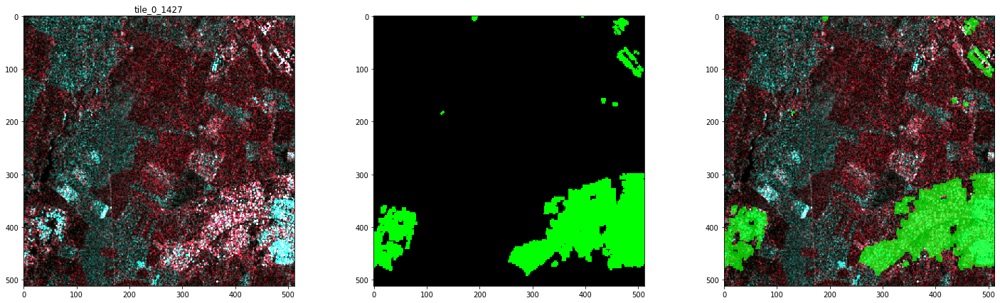

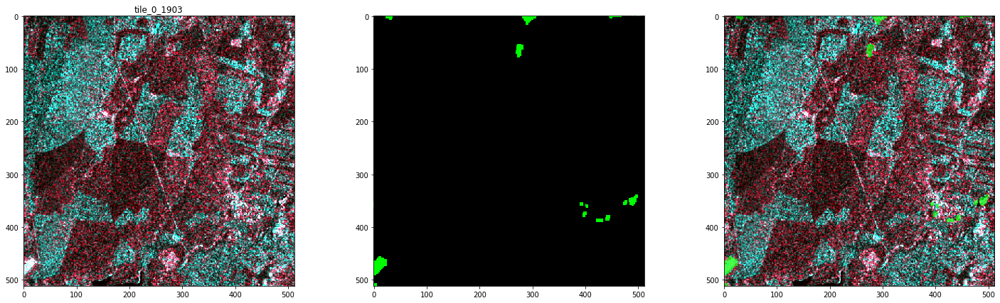

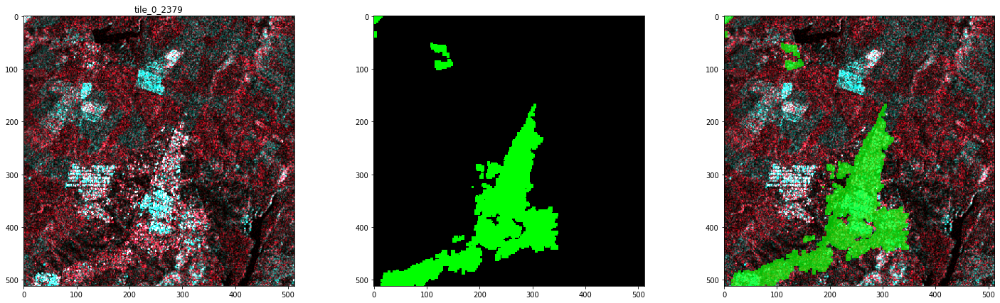

In [17]:
palette = [0, 0, 0, 0, 255, 0]

for i in [2, 3, 4]:
    dp = train_ds[i]
    _im = render_image(dp['image'])
    _mask = render_mask(dp['mask'], palette=palette)
    plt.figure(figsize=(25, 7))
    plt.subplot(131)
    plt.title(dp['meta']['image_path'].stem)
    plt.imshow(_im)
    plt.subplot(132)
    plt.imshow(_mask)
    plt.subplot(133)
    plt.imshow(render_datapoint(_im, _mask, blend_alpha=0.7))

In [52]:
dp = train_ds[3]

In [53]:
img = dp['image']
mask = dp['mask']

In [54]:
target_signal = img[mask > 0]
bg_signal = img[mask < 1]

In [55]:
import numpy as np

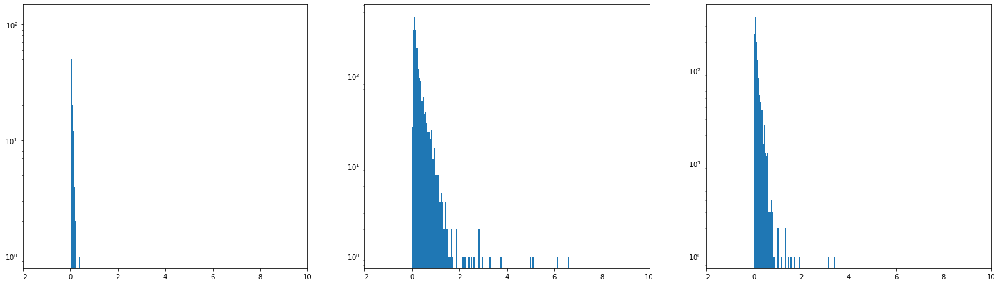

In [58]:
plt.figure(figsize=(25, 7))
for i in range(3):
    plt.subplot(1, 3, i + 1)    
    plt.hist(np.clip(target_signal[:, i], -10, 10), bins=128)
    plt.yscale('log')
    plt.xlim([-2, 10])

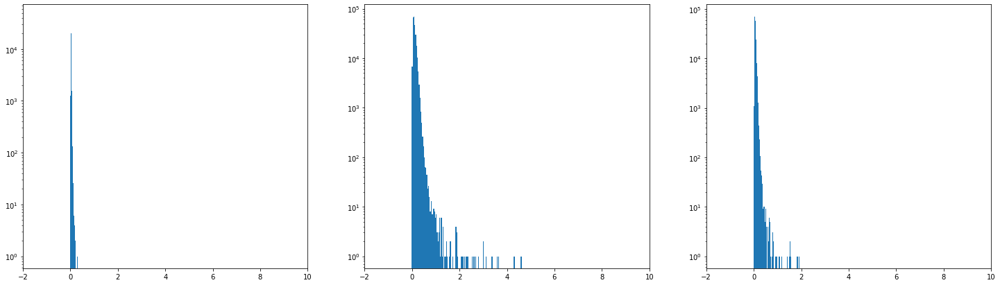

In [59]:
plt.figure(figsize=(25, 7))
for i in range(3):
    plt.subplot(1, 3, i + 1)
    plt.hist(np.clip(bg_signal[:, i], -10, 10), bins=128)
    plt.yscale('log')  
    plt.xlim([-2, 10])    

Validation dataset

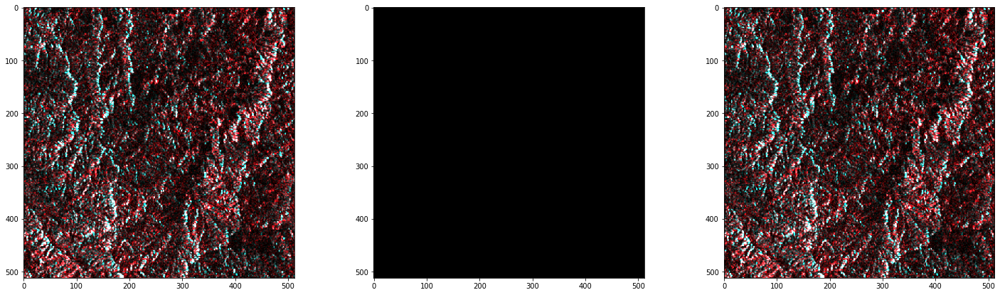

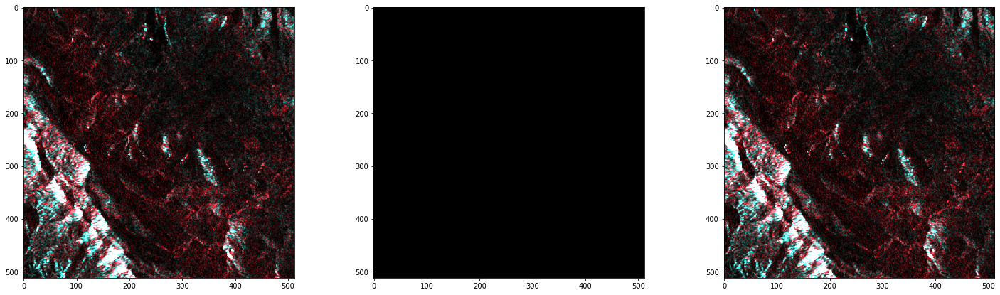

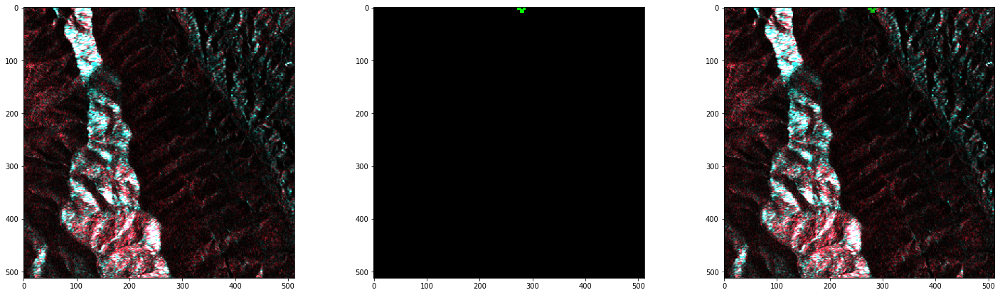

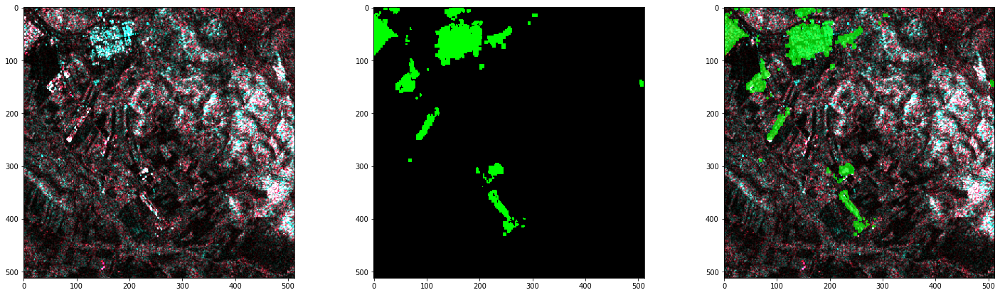

In [18]:
palette = [0, 0, 0, 0, 255, 0]

for i in [0, 10, 100, 1000,]:
    dp = val_ds[i]
    _im = render_image(dp['image'])
    _mask = render_mask(dp['mask'], palette=palette)
    plt.figure(figsize=(25, 7))
    plt.subplot(131)
    plt.imshow(_im)
    plt.subplot(132)
    plt.imshow(_mask)
    plt.subplot(133)
    plt.imshow(render_datapoint(_im, _mask, blend_alpha=0.7))

Test dataset

In [22]:
from dataflow.datasets import UnoSatTestTiles, read_img_only
from dataflow.transforms import TransformedDataset

In [23]:
p = "../input/test_tiles/"


test_ds = UnoSatTestTiles(p)
test_ds = TransformedDataset(test_ds, read_img_only)

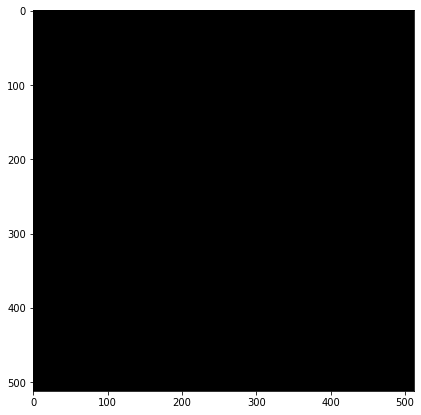

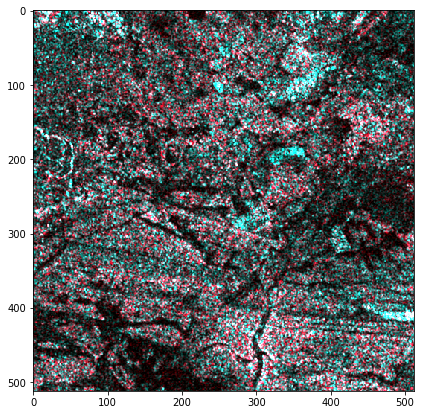

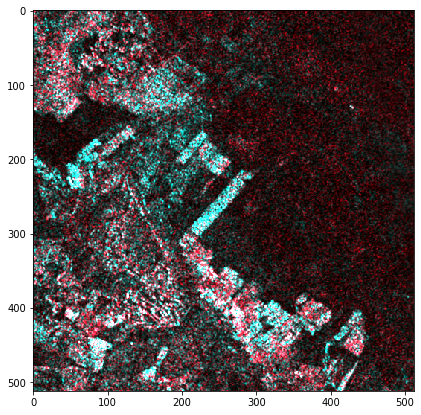

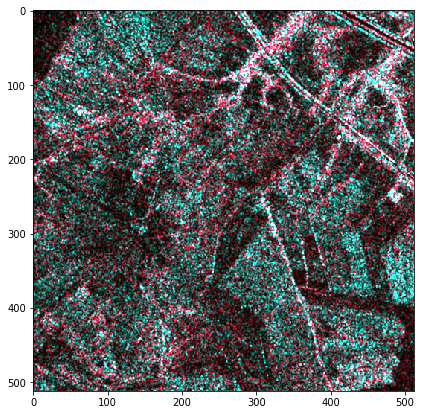

In [24]:
palette = [0, 0, 0, 0, 255, 0]

for i in [0, 10, 100, 1000,]:
    dp = test_ds[i]
    _im = render_image(dp['image'])
    plt.figure(figsize=(7, 7))
    plt.imshow(_im)

## Development

In [1]:
import sys
sys.path.insert(0, "../code")

In [13]:
from dataflow.io_utils import read_image
from dataflow.vis import render_image

In [6]:
p1 = '../input/train/Mosul_2015/s1tiling_S1A_IW_GRDH_1SDV_20150108T030926_20150108T030951_004074_004EC3_B908/38SLF/s1a_38SLF_vh_DES_20150108t030926.tif'
p2 = '../input/train/Mosul_2015/s1tiling_S1A_IW_GRDH_1SDV_20150108T030926_20150108T030951_004074_004EC3_B908/38SLF/s1a_38SLF_vv_DES_20150108t030926.tif'

In [104]:
from pathlib import Path


p = Path('../input/train')

vh_images = list(p.rglob("*vh*.tif"))
vv_images = [Path(pp.as_posix().replace("_vh_", "_vv_")) for pp in vh_images]

for p1, p2 in zip(vh_images, vv_images):
    assert p1.exists()
    assert p2.exists()
    print(p1, p2)    

../input/train/Nasiryah_2015/20150713_38RPV/s1a_38RPV_vh_ASC_20150713t145847.tif ../input/train/Nasiryah_2015/20150713_38RPV/s1a_38RPV_vv_ASC_20150713t145847.tif
../input/train/Nasiryah_2015/20150408_38RPV/s1a_38RPV_vh_ASC_20150408t145842.tif ../input/train/Nasiryah_2015/20150408_38RPV/s1a_38RPV_vv_ASC_20150408t145842.tif
../input/train/Nasiryah_2015/20150408_38RPV_2/s1a_38RPV_vh_ASC_20150408t145842.tif ../input/train/Nasiryah_2015/20150408_38RPV_2/s1a_38RPV_vv_ASC_20150408t145842.tif
../input/train/Nasiryah_2015/20150114_38RPV/s1a_38RPV_vh_ASC_20150114t145841.tif ../input/train/Nasiryah_2015/20150114_38RPV/s1a_38RPV_vv_ASC_20150114t145841.tif
../input/train/Nasiryah_2015/20151017_38RPV/s1a_38RPV_vh_ASC_20151017t145850.tif ../input/train/Nasiryah_2015/20151017_38RPV/s1a_38RPV_vv_ASC_20151017t145850.tif
../input/train/Mosul_2015/s1tiling_S1A_IW_GRDH_1SDV_20150812T030933_20150812T030958_007224_009E1D_B70E/38SLF/s1a_38SLF_vh_DES_20150812t030933.tif ../input/train/Mosul_2015/s1tiling_S1A_I

In [126]:
i = len(p.parts)
p1.parts[i:i + 2]

('Souleimaniye_2015',
 's1tiling_S1A_IW_GRDH_1SDV_20150713T150002_20150713T150027_006794_009227_046D')

In [130]:
for p1, p2 in zip(vh_images, vv_images):
    assert p1.exists()
    assert p2.exists()
    print(p1, p2)
    break

../input/train/Nasiryah_2015/20150713_38RPV/s1a_38RPV_vh_ASC_20150713t145847.tif ../input/train/Nasiryah_2015/20150713_38RPV/s1a_38RPV_vv_ASC_20150713t145847.tif


In [131]:
p1.parent.name

'20150713_38RPV'

In [159]:
!ls ../output/train/images_3b/

Mosul_2015  Najaf_2015	Nasiryah_2015  Souleimaniye_2015


In [149]:
!ls ../output/train/images_3b/Nasiryah_2015

20150408_38RPV_2_s1a_38RPV_3b_ASC_20150408t145842.tif
s1a_38RPV_3b_ASC_20150114t145841.tif
s1a_38RPV_3b_ASC_20150408t145842.tif
s1a_38RPV_3b_ASC_20150713t145847.tif
s1a_38RPV_3b_ASC_20151017t145850.tif


In [163]:
!ls ../output/train/masks/Nasiryah_2015

20150408_38RPV_2_s1a_38RPV_vh_ASC_20150408t145842.tif
s1a_38RPV_vh_ASC_20150114t145841.tif
s1a_38RPV_vh_ASC_20150408t145842.tif
s1a_38RPV_vh_ASC_20150713t145847.tif
s1a_38RPV_vh_ASC_20151017t145850.tif


In [164]:
p = "../output/train/images_3b/Nasiryah_2015/20150408_38RPV_2_s1a_38RPV_3b_ASC_20150408t145842.tif"
m = "../output/train/masks/Nasiryah_2015/20150408_38RPV_2_s1a_38RPV_vh_ASC_20150408t145842.tif"

In [165]:
img = read_image(p)
mask = read_image(m, dtype='uint8')

In [179]:
img_part = img[3000:3512, 3000:3512, :]
mask_part = mask[3000:3512, 3000:3512]

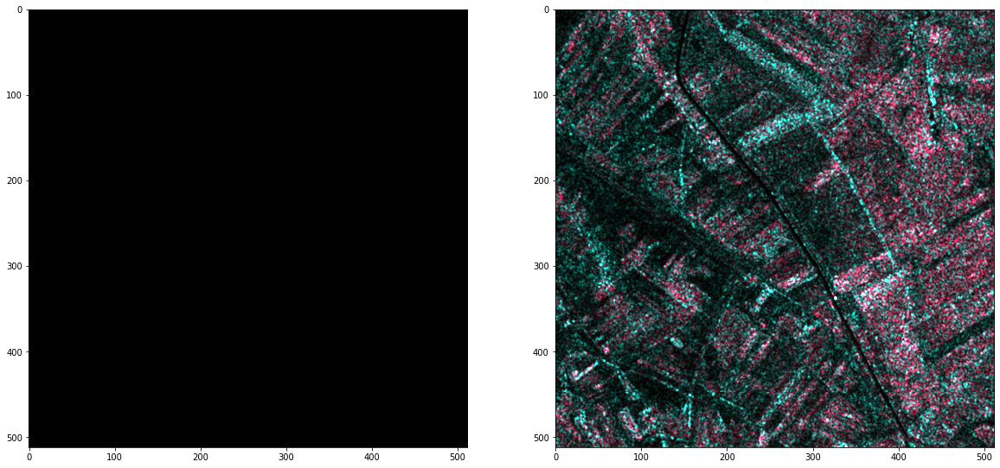

In [182]:
plt.figure(figsize=(20, 10))
plt.subplot(121)
plt.imshow(render_image(mask_part))
plt.subplot(122)
plt.imshow(render_image(img_part))

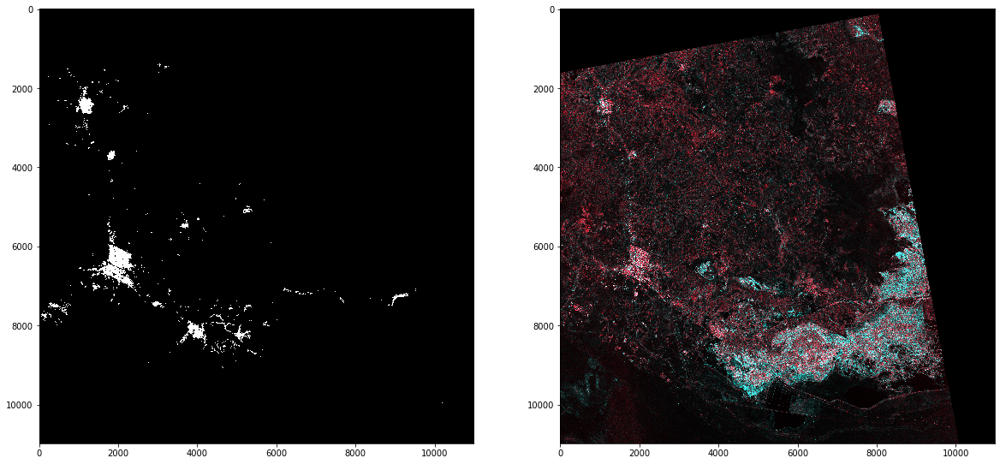

In [183]:
plt.figure(figsize=(20, 10))
plt.subplot(121)
plt.imshow(render_image(mask))
plt.subplot(122)
plt.imshow(render_image(img))

In [212]:
tuple(img_part.reshape((-1, img_part.shape[-1])).mean(axis=0))

(0.01747343, 0.0833679, 0.05042147)

In [189]:
!find ../output/train/images_3b -name *.tif | wc -l

17


In [229]:
!ls ../output/train/images_3b

Mosul_2015  Najaf_2015	Nasiryah_2015  Souleimaniye_2015


In [230]:
!ls ../output/train/images_3b/Mosul_2015

s1a_38SLF_3b_20150426.tif	      s1a_38SLF_3b_DES_20150812t030933.tif
s1a_38SLF_3b_DES_20150108t030926.tif  s1a_38SLF_3b_DES_20151222t030932.tif


In [ ]:
!ls ../output/train/tiles/images

In [ ]:
!ls ../input/train_tiles/images | wc -l

In [ ]:
!ls ../input/train_tiles/masks | wc -l

In [14]:
!find ../output/train/tiles/images -name *.tif | wc -l

8993


In [6]:
p = "../output/train/tiles/images/s1a_38SLF_3b_DES_20150108t030926.tif/tile_X_Y.tif"

In [7]:
folds = ["38SLF", "38RPV", "38SMA", "38SNE"]

In [9]:
fold_index = [f in p for f in folds].index(True)
fold_index

0

In [12]:
from pathlib import Path
from torch.utils.data import Dataset


class UnoSatTiles(Dataset):
    
    def __init__(self, path):
        path = Path(path)
        if not path.exists():
            raise ValueError(f"Path '{path.as_posix()}' is not found")
        
        masks_path = path / "masks"
        if not masks_path.exists():
            raise ValueError(f"Path '{masks_path.as_posix()}' is not found")
        images_path = path / "images"
        if not images_path.exists():
            raise ValueError(f"Path '{images_path.as_posix()}' is not found")

        self.path = path        
        self.masks = list(masks_path.rglob("*.tif"))
        if len(self.masks) < 1:
            raise RuntimeError(f"No mask images found at '{masks_path.as_posix()}'")

        self.images = [self._get_image_from_mask(m) for m in self.masks]
        
        for i in [int(c * len(self.images)) for c in [0.0, 0.1, 0.2, 0.5, 0.9]]:
            p = self.images[i]
            if not p.exists():
                raise RuntimeError(f"No images found at '{p.as_posix()}'")
    
    @staticmethod
    def _get_image_from_mask(mask):
        """Get image path from mask path:
                
        /path/masks/tile_id/tile_X_Y.tif
        """
        tile_id = mask.name
        tile_folder = mask.parent.name
        return mask.parent.parent.parent / "images" / tile_folder / tile_id
    
    def __len__(self):
        return len(self.masks)
    
    def __getitem__(self, index):
        return {
            "image": self.images[index],
            "mask": self.masks[index],
            "meta": {
                "image_path": self.images[index],
                "image_id": index
            }
        }

In [13]:
trainval_dataset = UnoSatTiles("../input/train/tiles")

ValueError: Path '../input/train/tiles/masks' is not found

In [82]:
len(trainval_dataset)

8464

In [83]:
trainval_dataset[0]

{'image': PosixPath('../output/train/tiles/images/s1a_38RPV_vh_ASC_20150114t145841_tiles/tile_0_0.tif'),
 'mask': PosixPath('../output/train/tiles/masks/s1a_38RPV_vh_ASC_20150114t145841_tiles/tile_0_0.tif'),
 'meta': {'image_path': PosixPath('../output/train/tiles/images/s1a_38RPV_vh_ASC_20150114t145841_tiles/tile_0_0.tif'),
  'image_id': 0}}

Original data

In [2]:
from pathlib import Path

In [3]:
data_path = "../input"

In [4]:
!ls ../input/train/Mosul_2015

38SLF_Mosul.cpg
38SLF_Mosul.dbf
38SLF_Mosul.prj
38SLF_Mosul.qpj
38SLF_Mosul.shp
38SLF_Mosul.shx
s1tiling_S1A_IW_GRDH_1SDV_20150108T030926_20150108T030951_004074_004EC3_B908
s1tiling_S1A_IW_GRDH_1SDV_20150426T030931_20150426T030956_005649_0073E6_2DFA
s1tiling_S1A_IW_GRDH_1SDV_20150812T030933_20150812T030958_007224_009E1D_B70E
s1tiling_S1A_IW_GRDH_1SDV_20151222T030932_20151222T030957_009149_00D2A0_F04A


In [20]:
!ls ../input/train/Mosul_2015/s1tiling_S1A_IW_GRDH_1SDV_20150108T030926_20150108T030951_004074_004EC3_B908/38SLF/

s1a_38SLF_vh_DES_20150108t030926.tif
s1a_38SLF_vh_DES_20150108t030926.tif.aux.xml
s1a_38SLF_vv_DES_20150108t030926.tif
s1a_38SLF_vv_DES_20150108t030926.tif.aux.xml
s1a_38SLF_vv_DES_20150108t030926_BorderMask.tif


In [27]:
!ls ../input/train/Mosul_2015/s1tiling_S1A_IW_GRDH_1SDV_20150426T030931_20150426T030956_005649_0073E6_2DFA/38SLF

s1a_38SLF_vh_20150426.tif	   s1a_38SLF_vv_20150426.tif
s1a_38SLF_vh_20150426.tif.aux.xml  s1a_38SLF_vv_20150426.tif.aux.xml


In [28]:
!ls ../input/train/Mosul_2015/s1tiling_S1A_IW_GRDH_1SDV_20151222T030932_20151222T030957_009149_00D2A0_F04A/38SLF

s1a_38SLF_vh_DES_20151222t030932.tif
s1a_38SLF_vv_DES_20151222t030932.tif
s1a_38SLF_vv_DES_20151222t030932_BorderMask.tif


In [47]:
!ls ../output/train/masks/Mosul_2015

s1a_38SLF_vh_20150426.tif	      s1a_38SLF_vh_DES_20150812t030933.tif
s1a_38SLF_vh_DES_20150108t030926.tif  s1a_38SLF_vh_DES_20151222t030932.tif


In [48]:
from typing import Union, Optional, Sequence
from pathlib import Path

import numpy as np
import gdal


def read_image(path: Union[str, Path],
               band_indices: Optional[Union[Sequence[int]]] = None,
               dtype: Optional[str] = None):
    """Read image tif file and apply the usual transformation

    Args:
        path: path of the tif file
        band_indices (list of integers, optional): indices of the band with an offset of 1
        dtype (str): output data type

    Return:
        A numpy array representation of the tif file
    """
    if isinstance(path, Path):
        path = path.as_posix()

    f = gdal.Open(path, gdal.GA_ReadOnly)
    assert f is not None, "Failed to read the file {}".format(path)

    if band_indices is None:
        band_indices = [i + 1 for i in range(f.RasterCount)]

    assert isinstance(band_indices, (list, tuple))

    if dtype is None:
        dtype = 'float32'

    output = np.zeros((f.RasterYSize, f.RasterXSize, len(band_indices)), dtype=dtype)
    for i, index in enumerate(band_indices):
        band = f.GetRasterBand(index)
        output[:, :, i] = band.ReadAsArray()

    if output.shape[-1] == 1:
        output = output.squeeze(-1)
    return output


In [49]:
p = "../input/train/Mosul_2015/s1tiling_S1A_IW_GRDH_1SDV_20150426T030931_20150426T030956_005649_0073E6_2DFA/38SLF/s1a_38SLF_vh_20150426.tif"
m = "../output/train/masks/Mosul_2015/s1a_38SLF_vh_20150426.tif"

In [50]:
img = read_image(p)
mask = read_image(m)

In [8]:
img.shape, img.min(), img.max()

((10980, 10979), -7.914729, 1305.3442)

In [53]:
mask.shape, mask.min(), mask.max()

((10980, 10979), 0.0, 1.0)

In [56]:
from typing import Union, Callable, Optional, Sequence

import numpy as np
from PIL import Image

import torch

try:
    from image_dataset_viz import render_datapoint
except ImportError:
    raise RuntimeError("Install it via pip install --upgrade git+https://github.com/vfdev-5/ImageDatasetViz.git")


def _getvocpallete(num_cls):
    n = num_cls
    pallete = [0]*(n*3)
    for j in range(0, n):
        lab = j
        pallete[j*3+0] = 0
        pallete[j*3+1] = 0
        pallete[j*3+2] = 0
        i = 0
        while lab > 0:
            pallete[j*3+0] |= (((lab >> 0) & 1) << (7-i))
            pallete[j*3+1] |= (((lab >> 1) & 1) << (7-i))
            pallete[j*3+2] |= (((lab >> 2) & 1) << (7-i))
            i = i + 1
            lab >>= 3
    return pallete


default_palette = _getvocpallete(256)


def render_mask(mask: Union[np.ndarray, Image.Image],
                palette: Sequence) -> Image.Image:
    if isinstance(mask, np.ndarray):
        mask = Image.fromarray(mask)
    mask.putpalette(palette)
    mask = mask.convert(mode='RGB')
    return mask

def instance_normalize(x, axis=(0, 1)):
    vmin = np.percentile(x, q=0.5, axis=axis, keepdims=True)
    vmax = np.percentile(x, q=99.5, axis=axis, keepdims=True)
    x = np.clip(x, a_min=vmin, a_max=vmax)
    x = (x - vmin) / (vmax - vmin + 1e-10)
    return x


def render_image(img):
    if img.ndim == 2:
        img = np.stack([img, img, img], axis=-1)
    return (255 * instance_normalize(img)).astype(np.uint8)


def render_mask(mask):
    mask = Image.fromarray(mask)
    mask = mask.convert("P")
    mask.putpalette(default_palette)
    mask = mask.convert(mode='RGB')
    return mask


In [62]:
# rimg = render_image(img)
# rmask = render_mask(mask)

# rimg = rimg[7500:8500, 3000:4000, :]
# rmask = np.asarray(rmask)[7500:8500, 3000:4000, :]

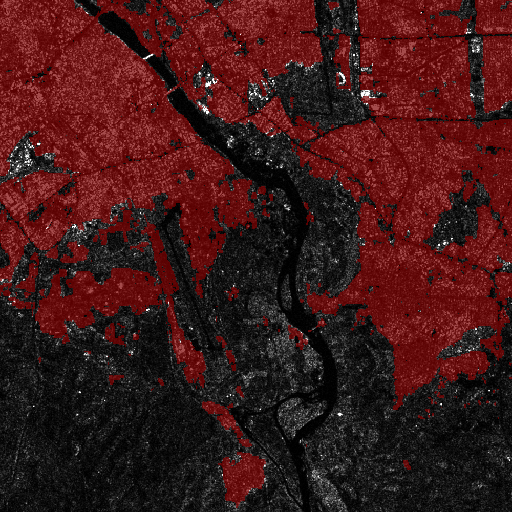

In [63]:
render_datapoint(rimg, rmask, output_size=(512, 512))